In [1]:
import os
import pandas as pd
import numpy as np
from IPython.display import display
import matplotlib
import matplotlib.pyplot as plt 
import seaborn as sns 
import plotly.offline as py
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
import plotly.offline as offline
import cufflinks as cf
py.init_notebook_mode(connected=True)
init_notebook_mode(connected=True)
offline.init_notebook_mode()
cf.go_offline()

## Data

In [2]:
heloc = pd.read_excel('heloc_featureset_final.xlsx')
display(heloc.head(n=5))

,RiskPerformance,MSinceOldestTradeOpen,AverageMInFile,NetFractionRevolvingBurden,NetFractionInstallBurden,NumBank2NatlTradesWHighUtilization,NumSatisfactoryTrades,NumTrades60Ever2DerogPubRec,MSinceMostRecentInqexcl7days
0,Bad,144,84,33,-8,1,20,3,0
1,Bad,58,41,0,-8,-8,2,4,0
2,Bad,66,24,53,66,1,9,0,0
3,Bad,169,73,72,83,3,28,1,0
4,Bad,333,132,51,89,0,12,0,0


In [3]:
riskperf_raw = heloc['RiskPerformance']
features = heloc.drop('RiskPerformance' , axis = 1)
dic={'Good':0, 'Bad':1}
riskperf = riskperf_raw.map(dic)
display(riskperf.head())
display(features.head().transpose())

0    1
1    1
2    1
3    1
4    1
Name: RiskPerformance, dtype: int64

,0,1,2,3,4
MSinceOldestTradeOpen,144,58,66,169,333
AverageMInFile,84,41,24,73,132
NetFractionRevolvingBurden,33,0,53,72,51
NetFractionInstallBurden,-8,-8,66,83,89
NumBank2NatlTradesWHighUtilization,1,-8,1,3,0
NumSatisfactoryTrades,20,2,9,28,12
NumTrades60Ever2DerogPubRec,3,4,0,1,0
MSinceMostRecentInqexcl7days,0,0,0,0,0


In [4]:
from sklearn.model_selection import train_test_split

cols = ['Model','Dataset','Best Params', 'File Name', 'True Positive', 'False Positive', 'True Negative', 'False Negative', 'Sensitivity', 'Specificity', 'G_Mean']
models_report = pd.DataFrame(columns = cols)
best_models = {}

X_train, X_test, y_train, y_test = train_test_split(features, riskperf, test_size=0.2, random_state=0)

## Scorer

In [5]:
from gmean_score import Gscore
from sklearn.metrics import make_scorer
def scre(y_true, y_pred):
    scre = Gscore(y_true, y_pred)
    return scre.g_mean()   


# Model Training & Optimisation


## Tuning using StratifiedShuffleSplit and GridSearchCV

In [6]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier 
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedShuffleSplit
import time
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate


In [37]:
def optimise_model(model, model_param, X_train, y_train, data, file): 
    rskfold = StratifiedShuffleSplit(n_splits=10, test_size=0.2, random_state=2)
    print('='*40)
    print('Computing {} '.format(model.__class__.__name__))
    print('='*40)
    clf = GridSearchCV(estimator=model, cv=rskfold, scoring= make_scorer(scre), return_train_score=True,
              param_grid= model_param) 
    print('Fitting...')
    start = time.time() # Get start time
    clf.fit(X_train, y_train.values)
    end = time.time() # Get end time
    training_time = end-start
    print("Training time: ", training_time)
    print("Best: %f using %s" % (clf.best_score_, clf.best_params_))
    means = clf.cv_results_['mean_test_score']
    stds = clf.cv_results_['std_test_score']
    params = clf.cv_results_['params']
    for mean, stdev, param in zip(means, stds, params):
        print("Mean score of %f with std dev of (%f) using params: %r" % (mean, stdev, param))
    print("\nBest estimator: " + str(clf.best_estimator_))
    y_train_pred = clf.best_estimator_.predict(X_train)
    scr = Gscore(y_train.values, y_train_pred)
    tmp = pd.Series({'Model': model.__class__.__name__,
                     'Dataset': data,
                     'Best Params': clf.best_params_,
                     'File Name': file, 
                        'True Positive' : scr.TP,
                        'False Positive' : scr.FP,
                        'True Negative' : scr.TN,
                        'False Negative' : scr.FN,
                        'Sensitivity': round(scr.sensi(),3),
                        'Specificity': round(scr.speci(),3),
                        'G_Mean': round(scr.g_mean(),3)})
          
    return clf.best_estimator_, pred_outcome(X_train,y_train,y_train_pred), tmp


## Testing using cross_val_score

In [59]:
def model_predict(model, X_test, y_test, data, file):
    
    rskfold = StratifiedShuffleSplit(n_splits=10, test_size=0.2, random_state=2)
    print('='*40)
    print('Computing {} '.format(model.__class__.__name__))
    print('='*40)
    print('\nPredicting...')
    start = time.time() # Get start time
    y_test_pred = model.predict(X_test)
    end = time.time() # Get end time
    training_time = end-start
    print("Prediction time: ", training_time)
    scr = Gscore(y_test.values, y_test_pred)
    results = cross_val_score(model, X_test, y_test.values, cv=rskfold, scoring=make_scorer(scre))
    #print(results)
    print("10-fold cross validation average G-mean: %.3f" % (results.mean()))
    tmp = pd.Series({'Model': model.__class__.__name__,
                     'Dataset': data,
                     'Best Params': model.get_params(),
                     'File Name': file, 
                        'True Positive' : scr.TP,
                        'False Positive' : scr.FP,
                        'True Negative' : scr.TN,
                        'False Negative' : scr.FN,
                        'Sensitivity': round(scr.sensi(),3),
                        'Specificity': round(scr.speci(),3),
                        'G_Mean': round(scr.g_mean(),3)})
    return pred_outcome(X_test,y_test,y_test_pred), tmp

## Predicting Outcome

In [40]:
    def pred_outcome(X,y_actual,y_pred):
        # Merge actual with predicted outcomes
        df1 = pd.DataFrame(data=y_actual.to_frame())
        df1['RiskPerformance_Pred'] = y_pred.tolist()
        
        # Classify prediction outcomes
        df1['Prediction'] = 'Correct'
        df1.loc[df1['RiskPerformance']> df1['RiskPerformance_Pred'],'Prediction'] = 'Incorrect: Bad Loan' #bad loan classified as good
        df1.loc[df1['RiskPerformance']< df1['RiskPerformance_Pred'],'Prediction'] = 'Incorrect: Good Loan' #good loan classified as bad
        
        #Visualisation of prediction
        temp = df1['Prediction'].value_counts()
        df = pd.DataFrame({'Labels': temp.index,'Counts': temp.values})
        print('\nPrediction Outcome :\n',df)
        df.iplot(kind='pie',labels='Labels',values='Counts', title='Prediction Breakdown')
        return X.join(df1)


### Supervised Models

In [57]:
clfs = {'LogReg' : LogisticRegression(),
            'TreeClass': DecisionTreeClassifier(),
            'GradBoost': GradientBoostingClassifier()
            }
clfs_params = {'LogReg' : {'C':np.arange(1e-05, 0.5, 0.01), 'penalty': ['l1','l2']} ,
            'TreeClass': {'max_depth':np.arange(2, 21, 4), 'min_samples_leaf':np.arange(50, 301, 50), 'min_samples_split': np.arange(100, 501, 100) },
             'GradBoost':{'learning_rate':(0.01, 0.21, 0.1) ,'n_estimators' :np.arange(100, 501, 200),'max_depth':np.arange(2, 10, 3),'min_samples_leaf':np.arange(50, 301, 100)}
            }
    
#

### Benchmark Model: Logistic Regression

#### Model Tuning

In [58]:
data = 'Training'
model= 'LogReg'
filename = model+'_'+data+ time.strftime("%Y%m%d-%H%M%S")+ '.xlsx'
best_model, prediction_outcome, model_report= optimise_model(clfs[model],clfs_params[model],X_train, y_train, data, filename)
   
best_models[model] = best_model
prediction_outcome.to_excel(filename)
models_report = models_report.append(model_report, ignore_index = True)

Computing LogisticRegression 
Fitting...
Training time:  72.97648310661316
Best: 0.696697 using {'C': 0.040010000000000004, 'penalty': 'l1'}
Mean score of 0.000000 with std dev of (0.000000) using params: {'C': 1.0000000000000001e-05, 'penalty': 'l1'}
Mean score of 0.671510 with std dev of (0.012113) using params: {'C': 1.0000000000000001e-05, 'penalty': 'l2'}
Mean score of 0.695781 with std dev of (0.010870) using params: {'C': 0.01001, 'penalty': 'l1'}
Mean score of 0.696107 with std dev of (0.010092) using params: {'C': 0.01001, 'penalty': 'l2'}
Mean score of 0.695337 with std dev of (0.011165) using params: {'C': 0.02001, 'penalty': 'l1'}
Mean score of 0.695768 with std dev of (0.008795) using params: {'C': 0.02001, 'penalty': 'l2'}
Mean score of 0.695592 with std dev of (0.010379) using params: {'C': 0.030009999999999998, 'penalty': 'l1'}
Mean score of 0.695582 with std dev of (0.009073) using params: {'C': 0.030009999999999998, 'penalty': 'l2'}
Mean score of 0.696697 with std dev

### Alternative Model 1: Decision Tree Classifier

#### Model Tuning

In [43]:
data = 'Training'
model= 'TreeClass'
filename = model+'_'+data+ time.strftime("%Y%m%d-%H%M%S")+ '.xlsx'
best_model, prediction_outcome, model_report= optimise_model(clfs[model],clfs_params[model],X_train, y_train, data, filename)
   
best_models[model] = best_model
prediction_outcome.to_excel(filename)
models_report = models_report.append(model_report, ignore_index = True)

Computing DecisionTreeClassifier 
Fitting...
Training time:  48.478346824645996
Best: 0.693898 using {'min_samples_leaf': 150, 'max_depth': 6, 'min_samples_split': 100}
Mean score of 0.650381 with std dev of (0.018007) using params: {'min_samples_leaf': 50, 'max_depth': 2, 'min_samples_split': 100}
Mean score of 0.650381 with std dev of (0.018007) using params: {'min_samples_leaf': 50, 'max_depth': 2, 'min_samples_split': 200}
Mean score of 0.650381 with std dev of (0.018007) using params: {'min_samples_leaf': 50, 'max_depth': 2, 'min_samples_split': 300}
Mean score of 0.650381 with std dev of (0.018007) using params: {'min_samples_leaf': 50, 'max_depth': 2, 'min_samples_split': 400}
Mean score of 0.650381 with std dev of (0.018007) using params: {'min_samples_leaf': 50, 'max_depth': 2, 'min_samples_split': 500}
Mean score of 0.650381 with std dev of (0.018007) using params: {'min_samples_leaf': 100, 'max_depth': 2, 'min_samples_split': 100}
Mean score of 0.650381 with std dev of (0.01

### Alternative Model 2: Gradient Boosting Classifier

#### Model Tuning

In [44]:
data = 'Training'
model= 'GradBoost'
filename = model+'_'+data+ time.strftime("%Y%m%d-%H%M%S")+ '.xlsx'
best_model, prediction_outcome, model_report= optimise_model(clfs[model],clfs_params[model],X_train, y_train, data, filename)
   
best_models[model] = best_model
prediction_outcome.to_excel(filename)
models_report = models_report.append(model_report, ignore_index = True)

Computing GradientBoostingClassifier 
Fitting...
Training time:  2613.4873628616333
Best: 0.711585 using {'learning_rate': 0.1, 'min_samples_leaf': 250, 'max_depth': 2, 'n_estimators': 100}
Mean score of 0.691711 with std dev of (0.009801) using params: {'learning_rate': 0.01, 'min_samples_leaf': 50, 'max_depth': 2, 'n_estimators': 100}
Mean score of 0.704421 with std dev of (0.009934) using params: {'learning_rate': 0.01, 'min_samples_leaf': 50, 'max_depth': 2, 'n_estimators': 300}
Mean score of 0.710070 with std dev of (0.008936) using params: {'learning_rate': 0.01, 'min_samples_leaf': 50, 'max_depth': 2, 'n_estimators': 500}
Mean score of 0.691376 with std dev of (0.009566) using params: {'learning_rate': 0.01, 'min_samples_leaf': 150, 'max_depth': 2, 'n_estimators': 100}
Mean score of 0.704151 with std dev of (0.008894) using params: {'learning_rate': 0.01, 'min_samples_leaf': 150, 'max_depth': 2, 'n_estimators': 300}
Mean score of 0.708314 with std dev of (0.008066) using params:

#### Model Evaluation

In [45]:
data = 'Testing'
model= 'LogReg'
filename = model+'_'+data+ time.strftime("%Y%m%d-%H%M%S")+ '.xlsx'

prediction_outcome, model_report= model_predict(best_models[model],X_test, y_test, data, filename)
prediction_outcome.to_excel(filename)
models_report = models_report.append(model_report, ignore_index = True)

Computing LogisticRegression 

Predicting...
Prediction time:  0.003991603851318359
5-fold cross validation average G-mean: 0.702

Prediction Outcome :
    Counts                Labels
0    1362               Correct
1     326   Incorrect: Bad Loan
2     285  Incorrect: Good Loan


In [46]:
data = 'Testing'
model= 'TreeClass'
filename = model+'_'+data+ time.strftime("%Y%m%d-%H%M%S")+ '.xlsx'

prediction_outcome, model_report= model_predict(best_models[model],X_test, y_test, data, filename)
prediction_outcome.to_excel(filename)
models_report = models_report.append(model_report, ignore_index = True)

Computing DecisionTreeClassifier 

Predicting...
Prediction time:  0.0
5-fold cross validation average G-mean: 0.658

Prediction Outcome :
    Counts                Labels
0    1363               Correct
1     315   Incorrect: Bad Loan
2     295  Incorrect: Good Loan


In [60]:
data = 'Testing'
model= 'GradBoost'
filename = model+'_'+data+ time.strftime("%Y%m%d-%H%M%S")+ '.xlsx'

prediction_outcome, model_report= model_predict(best_models[model],X_test, y_test, data, filename)
prediction_outcome.to_excel(filename)
models_report = models_report.append(model_report, ignore_index = True)

Computing GradientBoostingClassifier 

Predicting...
Prediction time:  0.11219239234924316
10-fold cross validation average G-mean: 0.707

Prediction Outcome :
    Counts                Labels
0    1412               Correct
1     299  Incorrect: Good Loan
2     262   Incorrect: Bad Loan


## Evaluation of models and final model selection

In [48]:
display(models_report)
outputfile = 'Model_Report_' + time.strftime("%Y%m%d")+ '.xlsx'
models_report.to_excel(outputfile, index = False)

,Model,Dataset,Best Params,File Name,True Positive,False Positive,True Negative,False Negative,Sensitivity,Specificity,G_Mean
0,LogisticRegression,Training,"{'C': 0.01001, 'penalty': 'l1'}",LogReg_Training20180825-073932.xlsx,2704.0,1313.0,2776.0,1099.0,0.711,0.679,0.695
1,DecisionTreeClassifier,Training,"{'min_samples_leaf': 150, 'max_depth': 6, 'min...",TreeClass_Training20180825-074014.xlsx,2735.0,1228.0,2861.0,1068.0,0.719,0.700,0.709
2,GradientBoostingClassifier,Training,"{'learning_rate': 0.1, 'min_samples_leaf': 150...",GradBoost_Training20180825-074156.xlsx,2671.0,1031.0,3058.0,1132.0,0.702,0.748,0.725
3,LogisticRegression,Testing,"{'C': 0.01001, 'dual': False, 'verbose': 0, 'p...",LogReg_Testing20180825-075747.xlsx,649.0,346.0,697.0,281.0,0.698,0.668,0.683
4,DecisionTreeClassifier,Testing,"{'criterion': 'gini', 'min_impurity_split': No...",TreeClass_Testing20180825-075756.xlsx,635.0,315.0,728.0,295.0,0.683,0.698,0.690
5,GradientBoostingClassifier,Testing,"{'loss': 'deviance', 'criterion': 'friedman_ms...",GradBoost_Testing20180825-075805.xlsx,630.0,262.0,781.0,300.0,0.677,0.749,0.712
6,LogisticRegression,Training,"{'C': 0.04001, 'penalty': 'l1'}",LogReg_Training20180825-095529.xlsx,2680.0,1275.0,2814.0,1123.0,0.705,0.688,0.696
7,DecisionTreeClassifier,Training,"{'min_samples_leaf': 150, 'max_depth': 6, 'min...",TreeClass_Training20180825-095639.xlsx,2735.0,1228.0,2861.0,1068.0,0.719,0.700,0.709
8,GradientBoostingClassifier,Training,"{'learning_rate': 0.1, 'min_samples_leaf': 250...",GradBoost_Training20180825-095730.xlsx,2672.0,1030.0,3059.0,1131.0,0.703,0.748,0.725
9,LogisticRegression,Testing,"{'C': 0.04001, 'dual': False, 'verbose': 0, 'p...",LogReg_Testing20180825-104107.xlsx,645.0,326.0,717.0,285.0,0.694,0.687,0.690


# Model Interpretation

## Global Model Interpretation

### Feature Importance

In [49]:
def print_coefs(coefs, training_columns):
    sorted_idx = np.argsort(-abs(coefs)) # negative for descending
    for (name, coef) in zip(np.array(training_columns)[sorted_idx], coefs[sorted_idx]):
        print("%s: %f" % (name, coef))

def plot_coefs(coefs, training_columns, title_suffix=''):
    sorted_idx = np.argsort(abs(coefs))
    pos = np.arange(len(coefs)) + .5
    plt.subplot(1, 2, 2)
    plt.barh(pos, coefs[sorted_idx], align='center')
    plt.yticks(pos, np.array(training_columns)[sorted_idx])
    plt.xlabel('Coef value')
    plt.title('Feature Importance' + title_suffix)
    plt.xlim(0, 0.5)
    plt.show()


#### Decision Tree Classifier

NetFractionRevolvingBurden: 0.486692
AverageMInFile: 0.195821
MSinceMostRecentInqexcl7days: 0.148487
NumTrades60Ever2DerogPubRec: 0.129505
NumSatisfactoryTrades: 0.029375
MSinceOldestTradeOpen: 0.006822
NumBank2NatlTradesWHighUtilization: 0.002438
NetFractionInstallBurden: 0.000859


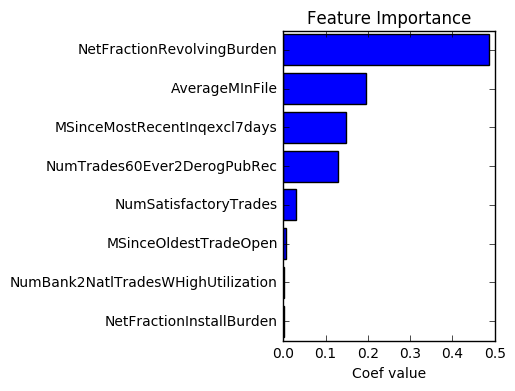

In [50]:
model='TreeClass'
importances = best_models[model].feature_importances_

print_coefs(importances,list(X_train.columns.values) )
plot_coefs(importances,list(X_train.columns.values) )

#### Gradient Boost

NetFractionRevolvingBurden: 0.206595
MSinceMostRecentInqexcl7days: 0.205278
NumSatisfactoryTrades: 0.141555
AverageMInFile: 0.134602
NumBank2NatlTradesWHighUtilization: 0.133808
NumTrades60Ever2DerogPubRec: 0.099691
MSinceOldestTradeOpen: 0.041961
NetFractionInstallBurden: 0.036511


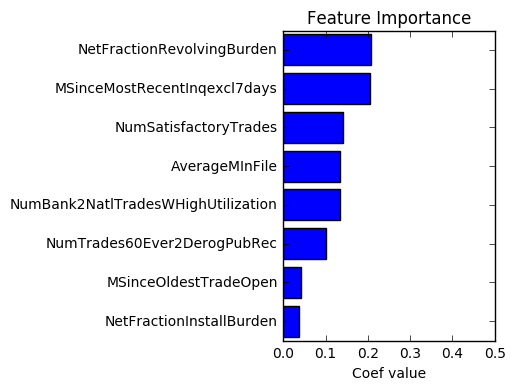

In [51]:
model='GradBoost'
importances = best_models[model].feature_importances_

print_coefs(importances,list(X_train.columns.values) )
plot_coefs(importances,list(X_train.columns.values) )

## Local Model Interpretation

### Local Interpretable Model-Agnostic Explanations (LIME)

In [52]:
import random
import lime
import lime.lime_tabular
from __future__ import print_function
import warnings
warnings.filterwarnings('ignore')

def local_exp(model, train_set, testinstance, num_feats):
    print('='*40)
    print('Model: {} '.format(model.__class__.__name__))
    print('='*40)

    # create explainer
    explainer = lime.lime_tabular.LimeTabularExplainer(train_set.values, feature_names=list(train_set.columns.values), class_names=['Good (0)','Bad (1)'], discretize_continuous=True)
    
    # explain instance
    exp = explainer.explain_instance(testinstance, model.predict_proba, num_features=num_feats)
    
    # show results
    exp.show_in_notebook(show_table=True, show_all=True)

    return True

### Correct Classification
#### Good Loan

In [61]:
#test_instance_index =random.choice(X_test.index.values.tolist())
test_instance_index = 2506
# 3986 bad loan classified as good
# 6705 bad loan classified as bad
# 8050 good loan classified as bad
print('Loan\n\tIndex: {} \t Actual Outcome: {} \n'.format(test_instance_index, y_test.loc[test_instance_index]))
print('Attributes: ')
print(X_test.loc[test_instance_index])

Explain = local_exp(best_models['GradBoost'],X_train, X_test.loc[test_instance_index].values,5)
    

Loan
	Index: 2506 	 Actual Outcome: 0 

Attributes: 
MSinceOldestTradeOpen                 117
AverageMInFile                         57
NetFractionRevolvingBurden              0
NetFractionInstallBurden               -8
NumBank2NatlTradesWHighUtilization      0
NumSatisfactoryTrades                  29
NumTrades60Ever2DerogPubRec             0
MSinceMostRecentInqexcl7days            0
Name: 2506, dtype: int64
Model: GradientBoostingClassifier 


### Correct Classification
#### Bad Loan

In [62]:
#test_instance_index =random.choice(X_test.index.values.tolist())
test_instance_index = 6705
# 3986 bad loan classified as good
# 6705 bad loan classified as bad
# 8050 good loan classified as bad
# 2506 good loan classified as good
print('Loan\n\tIndex: {} \t Actual Outcome: {} \n'.format(test_instance_index, y_test.loc[test_instance_index]))
print('Attributes: ')
print(X_test.loc[test_instance_index])

Explain = local_exp(best_models['GradBoost'],X_train, X_test.loc[test_instance_index].values,5)
    

Loan
	Index: 6705 	 Actual Outcome: 1 

Attributes: 
MSinceOldestTradeOpen                 76
AverageMInFile                        42
NetFractionRevolvingBurden            48
NetFractionInstallBurden              95
NumBank2NatlTradesWHighUtilization     0
NumSatisfactoryTrades                  6
NumTrades60Ever2DerogPubRec            1
MSinceMostRecentInqexcl7days           0
Name: 6705, dtype: int64
Model: GradientBoostingClassifier 


### Inorrect Classification
#### Good Loan classified as Bad

In [63]:
#test_instance_index =random.choice(X_test.index.values.tolist())
test_instance_index = 449
print('Loan\n\tIndex: {} \t Actual Outcome: {} \n'.format(test_instance_index, y_test.loc[test_instance_index]))
print('Attributes: ')
print(X_test.loc[test_instance_index])

Explain = local_exp(best_models['GradBoost'],X_train, X_test.loc[test_instance_index].values,5)
    

Loan
	Index: 449 	 Actual Outcome: 0 

Attributes: 
MSinceOldestTradeOpen                 156
AverageMInFile                         51
NetFractionRevolvingBurden             31
NetFractionInstallBurden               69
NumBank2NatlTradesWHighUtilization      0
NumSatisfactoryTrades                  14
NumTrades60Ever2DerogPubRec             0
MSinceMostRecentInqexcl7days            0
Name: 449, dtype: int64
Model: GradientBoostingClassifier 


### Inorrect Classification
#### Bad Loan classified as Good

In [64]:
test_instance_index =random.choice(X_test.index.values.tolist())
test_instance_index = 5221

print('Loan\n\tIndex: {} \t Actual Outcome: {} \n'.format(test_instance_index, y_test.loc[test_instance_index]))
print('Attributes: ')
print(X_test.loc[test_instance_index])

Explain = local_exp(best_models['GradBoost'],X_train, X_test.loc[test_instance_index].values,5)
    

Loan
	Index: 5221 	 Actual Outcome: 1 

Attributes: 
MSinceOldestTradeOpen                 168
AverageMInFile                         85
NetFractionRevolvingBurden             40
NetFractionInstallBurden               95
NumBank2NatlTradesWHighUtilization      0
NumSatisfactoryTrades                  23
NumTrades60Ever2DerogPubRec             0
MSinceMostRecentInqexcl7days            0
Name: 5221, dtype: int64
Model: GradientBoostingClassifier 
